
This step installs all the necessary dependencies for our license plate detection and recognition pipeline.  


In [1]:
import os

# Ensure proper locale settings (for PaddleOCR compatibility)
os.environ["LC_ALL"] = "C.UTF-8"
os.environ["LANG"] = "C.UTF-8"

# Core OCR and model libraries
!pip install paddlepaddle     # Core deep learning library for PaddleOCR
!pip install paddleocr        # OCR model from Baidu, used for recognition benchmarking
!pip install easyocr          # Lightweight OCR model, also used for baseline comparison

# ViT + Training Utilities
!pip install timm             # Pretrained transformer models — used to load ViTSTR
!pip install pytorch-lightning # High-level wrapper for training PyTorch models
!pip install torchmetrics     # Easy metric tracking for PyTorch/Lightning models

# OpenCV installation for image handling
!sudo apt install libopencv-dev python3-opencv -y  # Install OpenCV with system support
!apt install opencv-data                          # Includes Haar cascades, image filters, etc.

# YOLOv8 detection model
!pip install ultralytics      # Install YOLOv8 from Ultralytics (used for plate detection)


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libopencv-dev is already the newest version (4.5.4+dfsg-9ubuntu4+jammy0).
python3-opencv is already the newest version (4.5.4+dfsg-9ubuntu4+jammy0).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
opencv-data is already the newest version (4.5.4+dfsg-9ubuntu4+jammy0).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


##  Import Required Libraries

This step imports all the libraries used throughout the project — covering data handling, visualization, deep learning, OCR, and utilities.



####  Data Processing & Visualization:
- `numpy`, `pandas`: Data manipulation
- `matplotlib.pyplot`, `seaborn`: Plotting and analysis
- `zipfile`, `shutil`: File handling (unzipping, copying)

####  Image & OCR Utilities:
- `PIL.Image`, `ImageDraw`: Image drawing and cropping
- `cv2` (OpenCV): Advanced image handling
- `IPython.display`: For inline image display in notebooks
- `re`: Regular expressions (useful for plate string formatting)

####  OCR Libraries:
- `PaddleOCR`: For benchmarking using Paddle OCR
- `easyocr`: Another OCR baseline for comparison

####  Deep Learning Libraries:
- `torch`, `torch.nn`, `torchvision.transforms`: Core PyTorch modules
- `torch.utils.data`: Dataset and DataLoader classes
- `timm`: Pretrained Vision Transformer (ViTSTR backbone)
- `ultralytics`: YOLOv8 object detection
- `torch.nn.functional`, `torch.optim`: Loss and optimization

####  Model Evaluation:
- `tqdm`: For progress bars
- `SequenceMatcher` (from difflib): Used for character-level accuracy
- `confusion_matrix`, `Counter`: For evaluation and error analysis



In [2]:
#Data Processing & Visualization:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import zipfile
import shutil

#Image & OCR Utilities:

import re
from sklearn.preprocessing import LabelEncoder
from PIL import Image, ImageDraw
import random
import cv2
from PIL import Image


# Deep Learning Libraries:

from ultralytics import YOLO
import torch
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import timm
import torch.nn.functional as F
import torch.optim as optim

#OCR Libraries:

from paddleocr import PaddleOCR
import easyocr

# Model Evaluation:

from difflib import SequenceMatcher
from sklearn.metrics import confusion_matrix
from collections import Counter
from tqdm import tqdm


## Extract Dataset ZIP Files

We unzip the three main datasets needed for our pipeline:

### Files Extracted:
- `Licplatesdetection_train.zip`: Contains training images for license plate **detection**.
- `Licplatesrecognition_train.zip`: Contains cropped plate images with labels for **recognition**.
- `test.zip`: Contains **unlabeled test images** (for final predictions).

These files are extracted into dedicated folders for structured access later in the notebook.


In [3]:
zipfile_path1='/content/Licplatesdetection_train.zip'
extract_path1='/content/Licplatesdetection_train'

with zipfile.ZipFile(zipfile_path1,'r') as zip_ref:
  zip_ref.extractall(extract_path1)


zipfile_path2='/content/Licplatesrecognition_train.zip'
extract_path2='/content/Licplatesrecognition_train'

with zipfile.ZipFile(zipfile_path2,'r') as zip_ref:
  zip_ref.extractall(extract_path2)

zip_file3='/content/test.zip'
extract_path3='/content/test'
with zipfile.ZipFile(zip_file3,'r') as zip_ref:
  zip_ref.extractall(extract_path3)

### Load Detection Label File
We load the Licplatesdetection_train.csv file, which contains bounding box coordinates (x1, y1, x2, y2) for each image used in the license plate detection step.


In [4]:
license_bounds_file='/content/Licplatesdetection_train.csv'
license_bounds=pd.read_csv(license_bounds_file)
license_bounds.head(4)

,img_id,ymin,xmin,ymax,xmax
0,1.jpg,276,94,326,169
1,10.jpg,311,395,344,444
2,100.jpg,406,263,450,434
3,101.jpg,283,363,315,494


###  Sort Image IDs Numerically

Image filenames like `'1.jpg', '10.jpg', '2.jpg'` may appear in incorrect order by default.  
This step sorts them **numerically** using a custom function so the order matches the dataset correctly.


In [5]:
def numerical_sort(filename):
  numbers=re.findall(r'\d+',filename)
  return int(numbers[0]) if numbers else 0

license_bounds=license_bounds.sort_values(by="img_id",key= lambda x: x.map(numerical_sort)).reset_index(drop=True)
license_bounds.head(5)

,img_id,ymin,xmin,ymax,xmax
0,1.jpg,276,94,326,169
1,2.jpg,297,96,324,209
2,3.jpg,525,216,547,397
3,4.jpg,190,131,210,216
4,5.jpg,359,48,406,148


In [6]:
print(os.listdir('/content/Licplatesdetection_train'))

['license_plates_detection_train']


### Load Detection images File
We load the license_plates_detection_train file, which contains images  and these will be used in  the license plate detection step.


In [7]:
images_folder='/content/Licplatesdetection_train/license_plates_detection_train/'
detection_images_files=sorted(os.listdir(images_folder))
print(detection_images_files[:20])

['1.jpg', '10.jpg', '100.jpg', '101.jpg', '102.jpg', '103.jpg', '104.jpg', '105.jpg', '106.jpg', '107.jpg', '108.jpg', '109.jpg', '11.jpg', '110.jpg', '111.jpg', '112.jpg', '113.jpg', '114.jpg', '115.jpg', '116.jpg']


###  Sort Image IDs Numerically

Image filenames like `'1.jpg', '10.jpg', '2.jpg'` may appear in incorrect order by default.  
This step sorts them **numerically** using a custom function so the order matches the dataset correctly.

In [8]:
def numerical_sort(filename):
  numbers= re.findall(r'\d+',filename)
  return int(numbers[0]) if numbers else 0


detection_images_files=sorted(os.listdir(images_folder),key=numerical_sort)
print(detection_images_files[:20])



['1.jpg', '2.jpg', '3.jpg', '4.jpg', '5.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '20.jpg']


In [9]:
print(os.listdir('/content/Licplatesrecognition_train'))

['license_plates_recognition_train']


### Load recognition images File
We load the license_plates_recognition_train file, which contains images  and these will be used in  the license plate recognition step.

###  Sort Image IDs Numerically

Image filenames like `'1.jpg', '10.jpg', '2.jpg'` may appear in incorrect order by default.  
This step sorts them **numerically** using a custom function so the order matches the dataset correctly.


In [10]:
license_regonition_images="/content/Licplatesrecognition_train/license_plates_recognition_train"


def numerical_sort(filename):
  numbers=re.findall(r'\d+',filename)
  return int(numbers[0]) if numbers else 0

regonition_files=sorted(os.listdir(license_regonition_images),key=numerical_sort)
print(regonition_files[:5])



['0.jpg', '1.jpg', '2.jpg', '3.jpg', '4.jpg']


### Load recognition Label File
We load the Licplatesrecognition_train.csv' file, which contains the ground truth as label or text column for each plate image used in the license plate recognition  step.


In [11]:
recognition_characte_file='/content/Licplatesrecognition_train.csv'
recognition_character=pd.read_csv(recognition_characte_file)
recognition_character.head(5)

,img_id,text
0,0.jpg,117T3989
1,1.jpg,128T8086
2,10.jpg,94T3458
3,100.jpg,133T6719
4,101.jpg,68T5979


###  Sort Image IDs Numerically

Image filenames like `'1.jpg', '10.jpg', '2.jpg'` may appear in incorrect order by default.  
This step sorts them **numerically** using a custom function so the order matches the dataset correctly.

In [12]:
def numerical_sort(filename):
  numbers=re.findall(r'\d+',filename)
  return int(numbers[0]) if numbers else 0

recognition_character=recognition_character.sort_values(by="img_id", key=lambda x:x.map(numerical_sort)).reset_index(drop=True)
recognition_character.head(5)


,img_id,text
0,0.jpg,117T3989
1,1.jpg,128T8086
2,2.jpg,170T6123
3,3.jpg,103T1643
4,4.jpg,62T1040


### Load test  data file File
We load the test  data file, which contains images  and these will be used for testing the model developed.

###  Sort Image IDs Numerically

Image filenames like `'1.jpg', '10.jpg', '2.jpg'` may appear in incorrect order by default.  
This step sorts them **numerically** using a custom function so the order matches the dataset correctly.


In [13]:
test_data_files='/content/test/test/test'

def numerical_sort(filename):
  numbers=re.findall(r'\d+',filename)
  return int(numbers[0]) if numbers else 0

test_data=os.listdir(test_data_files)
test_data=sorted(test_data, key=numerical_sort)
print(test_data[:15])


['901.jpg', '902.jpg', '903.jpg', '904.jpg', '905.jpg', '906.jpg', '907.jpg', '908.jpg', '909.jpg', '910.jpg', '911.jpg', '912.jpg', '913.jpg', '914.jpg', '915.jpg']


## Check null values

In [14]:
license_bounds.isnull().sum()

,0
img_id,0
ymin,0
xmin,0
ymax,0
xmax,0


## checking the licence label file info

In [15]:
license_bounds.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   img_id  900 non-null    object
 1   ymin    900 non-null    int64 
 2   xmin    900 non-null    int64 
 3   ymax    900 non-null    int64 
 4   xmax    900 non-null    int64 
dtypes: int64(4), object(1)
memory usage: 35.3+ KB


## checking the licence label file descrition

In [16]:
license_bounds.describe()


,ymin,xmin,ymax,xmax
count,900.000000,900.000000,900.000000,900.000000
mean,308.596667,240.044444,356.741111,368.750000
std,75.768988,142.368243,71.955977,149.029253
min,14.000000,1.000000,121.000000,84.000000
25%,263.000000,129.000000,313.000000,245.750000
50%,314.000000,212.000000,359.000000,338.000000
75%,363.000000,320.250000,410.000000,485.250000
max,525.000000,698.000000,547.000000,823.000000


## checking the licence label file data integrety

In [17]:
license_bounds.duplicated().sum()

0

In [18]:
len(os.listdir(images_folder))

900

## checking the format of each image folder

In [19]:
image_formats_dectection= set([img.lower().split('.')[-1] for img in os.listdir(images_folder)])
print(image_formats_dectection)

image_format_recognition=set([img.lower().split(".")[-1] for img in os.listdir(license_regonition_images)])
print(image_format_recognition)

image_format_test=set([img.lower().split('.')[-1] for img in os.listdir(test_data_files)])
print(image_format_test)

{'jpg'}
{'jpg'}
{'jpg'}


## checking the corrupted images in three image files

In [20]:
corrruted_image_detection = []
for img_name in os.listdir(images_folder):
    try:
        img = Image.open(os.path.join(images_folder,img_name))
        img.verify()
    except:
        corrruted_image_detection.append(img_name)

print( corrruted_image_detection)



corrupted_images_recognition = []
for img_name in os.listdir(license_regonition_images):
  try:
    img=Image.open(os.path.join(license_regonition_images,img_name))
    img.verify()
  except:
    corrupted_images_recognition.append(img_name)

print("corrupted_image_recognition:" , corrupted_images_recognition)



corrupted_images_test = []
for img_name in os.listdir(test_data_files):
    try:
        img = Image.open(os.path.join(test_data_files, img_name))
        img.verify()  # Verify image integrity
    except:
        corrupted_images_test.append(img_name)

print("Corrupt images:", corrupted_images_test)


[]
corrupted_image_recognition: []
Corrupt images: []


Checking the resolution for the three image files

In [21]:
img_shapes = []
for img_name in os.listdir(images_folder)[:20]:
    img =Image.open(os.path.join(images_folder,img_name))
    img_shapes.append(img.size)
print("Unique detection image sizes:", set(img_shapes))


img_shapes = []
for img_name in os.listdir(license_regonition_images)[:15]:
    img=Image.open(os.path.join(license_regonition_images, img_name))
    img_shapes.append(img.size)


print("Unique recognition image sizes:", set(img_shapes))



img_shapes = []
for img_name in os.listdir(test_data_files)[:20]:  # Checking first 50 images
    img = Image.open(os.path.join(test_data_files, img_name))
    img_shapes.append(img.size)  # (width, height)

print("Unique test image sizes:", set(img_shapes))



Unique detection image sizes: {(307, 547), (850, 476), (729, 547), (824, 547), (730, 546), (410, 547), (850, 509), (850, 477)}
Unique recognition image sizes: {(90, 24), (88, 17), (180, 56), (111, 29), (100, 31), (120, 54), (115, 83), (89, 22), (138, 44), (114, 45), (147, 57), (180, 101), (107, 34), (86, 28), (285, 73)}
Unique test image sizes: {(465, 349), (489, 547), (639, 360), (729, 547), (359, 479), (547, 729), (410, 547), (411, 547), (479, 269), (850, 477)}


After seeing the image  shape there are  completely inconsistent and varying . so now making a fixed image  shape like for detection and test images keeping target size as  640*640 and for recognition keeping target size as 256 * 64 .Because in this i am going to use different model like Yolov8  and Rcnn .so the yolov8 work better for fixed lenght and rcnn work  better for  even varying dimension . so i have  decided to keep  a consistent or fixed target size for the all the images for train detection and recognistion and test images.

In [22]:
class LetterboxResize:
    def __init__(self, target_size):
        self.target_size = target_size

    def resize_with_padding(self, image, bbox, orig_size):
        old_size = orig_size
        ratio = min(self.target_size[0] / old_size[0], self.target_size[1] / old_size[1])
        new_size = tuple([int(x * ratio) for x in old_size])

        image = image.resize(new_size, Image.LANCZOS)
        new_img = Image.new("RGB", self.target_size, (0, 0, 0))
        offset_x = (self.target_size[0] - new_size[0]) // 2
        offset_y = (self.target_size[1] - new_size[1]) // 2

        new_img.paste(image, (offset_x, offset_y))

        if bbox is None:
            return new_img, None

        new_bbox = [
            int(bbox[0] * ratio + offset_x),
            int(bbox[1] * ratio + offset_y),
            int(bbox[2] * ratio + offset_x),
            int(bbox[3] * ratio + offset_y),
        ]
        return new_img, new_bbox

    def process_folder(self, input_folder, output_folder, sorted_csv_file, bbox_csv_path=None, license_bounds=None):
        """Process images from raw folder → letterbox → sorted CSV."""

        os.makedirs(output_folder, exist_ok=True)

        def numerical_sort(filename):
            numbers = re.findall(r'\d+', filename)
            return int(numbers[0]) if numbers else float('inf')

        # Get sorted list of images
        image_files = [f for f in os.listdir(input_folder) if f.lower().endswith('.jpg')]
        sorted_images = sorted(image_files, key=numerical_sort)

        sorted_df = pd.DataFrame(sorted_images, columns=["image_name"])
        sorted_df.to_csv(sorted_csv_file, index=False)
        print(f" Sorted filenames saved to {sorted_csv_file}")

        sorted_images = sorted_df["image_name"].tolist()

        print(f"Processing {len(sorted_images)} images from {input_folder}...")

        updated_bboxes = []

        for img_name in sorted_images:
            img_path = os.path.join(input_folder, img_name)
            img = Image.open(img_path)
            orig_width, orig_height = img.size

            if license_bounds is not None:
                bbox_row = license_bounds[license_bounds["img_id"] == img_name]
                if bbox_row.empty:
                    print(f" No bounding box found for {img_name}, skipping.")
                    continue

                xmin, ymin, xmax, ymax = bbox_row.iloc[0][["xmin", "ymin", "xmax", "ymax"]]
                bbox = (xmin, ymin, xmax, ymax)

                resized_img, new_bbox = self.resize_with_padding(img, bbox, (orig_width, orig_height))
                updated_bboxes.append([img_name, new_bbox[0], new_bbox[1], new_bbox[2], new_bbox[3]])
            else:
                resized_img, _ = self.resize_with_padding(img, None, (orig_width, orig_height))

            resized_img.save(os.path.join(output_folder, img_name))

        print(f" Letterbox Resizing Completed for {input_folder}, Saved to {output_folder}")

        if license_bounds is not None:
            updated_bboxes_df = pd.DataFrame(updated_bboxes, columns=["img_id", "xmin", "ymin", "xmax", "ymax"])
            updated_bboxes_df.to_csv(bbox_csv_path, index=False)
            print(f" Updated bounding boxes saved to {bbox_csv_path}")

# Initialize Parameters
TARGET_SIZE_DETECTION = (640, 640)
TARGET_SIZE_RECOGNITION = (256, 64)

letterbox_detection = LetterboxResize(TARGET_SIZE_DETECTION)
letterbox_recognition = LetterboxResize(TARGET_SIZE_RECOGNITION)

# **Step 1: Define Original Image Paths**
images_folder = "/content/Licplatesdetection_train/license_plates_detection_train"
license_regonition_images = "/content/Licplatesrecognition_train/license_plates_recognition_train"
test_data_files = "/content/test/test/test"

# **Step 2: Define Letterbox Output Paths**
output_detection = "/content/Output/letterbox_detection"
output_test = "/content/Output/letterbox_test"
output_recognition = "/content/Output/letterbox_recognition"

# **Step 3: Define Model Input Paths (Metadata)**
model_inputs_folder = "/content/model_inputs/"
os.makedirs(model_inputs_folder, exist_ok=True)

sorted_csv_detection = os.path.join(model_inputs_folder, "sorted_detection.csv")
sorted_csv_test = os.path.join(model_inputs_folder, "sorted_test.csv")
sorted_csv_recognition = os.path.join(model_inputs_folder, "sorted_recognition.csv")
bbox_csv_path = os.path.join(model_inputs_folder, "updated_bboxes.csv")

# **Step 4: Run Letterbox Resizing & Sorting**
letterbox_detection.process_folder(images_folder, output_detection, sorted_csv_detection, bbox_csv_path, license_bounds)
letterbox_detection.process_folder(test_data_files, output_test, sorted_csv_test)
letterbox_recognition.process_folder(license_regonition_images, output_recognition, sorted_csv_recognition)


 Sorted filenames saved to /content/model_inputs/sorted_detection.csv
Processing 900 images from /content/Licplatesdetection_train/license_plates_detection_train...
 Letterbox Resizing Completed for /content/Licplatesdetection_train/license_plates_detection_train, Saved to /content/Output/letterbox_detection
 Updated bounding boxes saved to /content/model_inputs/updated_bboxes.csv
 Sorted filenames saved to /content/model_inputs/sorted_test.csv
Processing 210 images from /content/test/test/test...
 Letterbox Resizing Completed for /content/test/test/test, Saved to /content/Output/letterbox_test
 Sorted filenames saved to /content/model_inputs/sorted_recognition.csv
Processing 900 images from /content/Licplatesrecognition_train/license_plates_recognition_train...
 Letterbox Resizing Completed for /content/Licplatesrecognition_train/license_plates_recognition_train, Saved to /content/Output/letterbox_recognition


In [23]:
# Define paths
sorted_csv_file_test = "/content/model_inputs/sorted_test.csv"
sorted_images_folder_test = "/content/Output/letterbox_test"
sorted_csv_file_recognition = "/content/model_inputs/sorted_recognition.csv"
sorted_images_folder_recognition = "/content/Output/letterbox_recognition"
sorted_csv_file_detection = "/content/model_inputs/sorted_detection.csv"
sorted_images_folder_detection = "/content/Output/letterbox_detection"
sorted_bbox_csv_file = "/content/model_inputs/updated_bboxes.csv"


# Read sorted filenames from the text file

sorted_df_test = pd.read_csv(sorted_csv_file_test)
sorted_df_recognition = pd.read_csv(sorted_csv_file_recognition)
sorted_df_detection = pd.read_csv(sorted_csv_file_detection)
sorted_bbox_df = pd.read_csv(sorted_bbox_csv_file)

#checking the image sizes of the dection after resizing
sorted_filenames = sorted_df_detection["image_name"].tolist()

# Check first 20 images
img_shapes = []
for img_name in sorted_filenames[:20]:  # Read from the text file
    img_path = os.path.join(sorted_images_folder_detection, img_name)  #Load from sorted_detection folder
    img = Image.open(img_path)
    img_shapes.append(img.size)

# Print unique image sizes
print(" Unique output detection image sizes:", set(img_shapes))


 Unique output detection image sizes: {(640, 640)}


## Checking single image before and apply the resize.

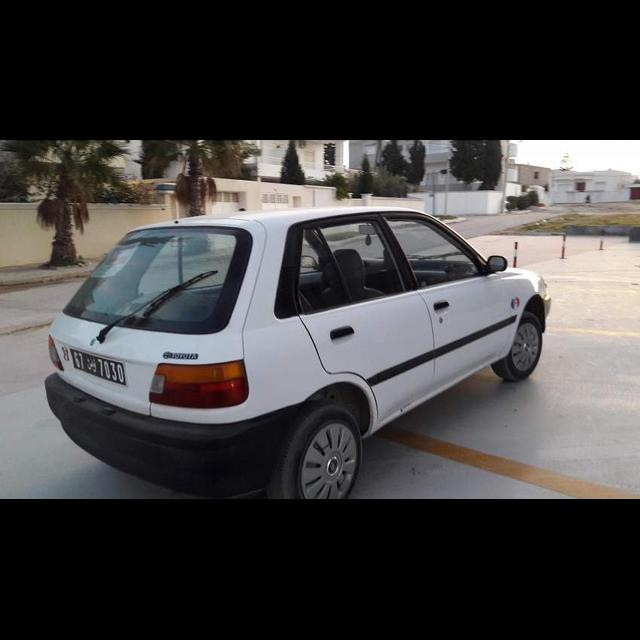

In [24]:
# Define the image path
img_path = "/content/Output/letterbox_detection/1.jpg"

# Open and display the image
img = Image.open(img_path)
img.show()
img

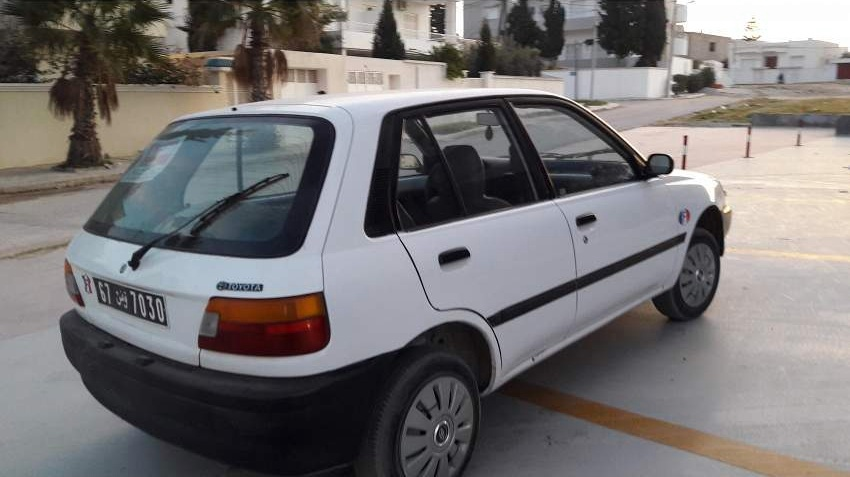

In [25]:
# Define the image path
img_path = "/content/Licplatesdetection_train/license_plates_detection_train/1.jpg"

# Open and display the image
img = Image.open(img_path)
img.show()
img

In [26]:
len(os.listdir("/content/Output/letterbox_test"))

210

In this step, we inspect the bounding box coordinates on detection images.
We visualize how the boxes look before and after resizing the images to ensure they are still accurate.

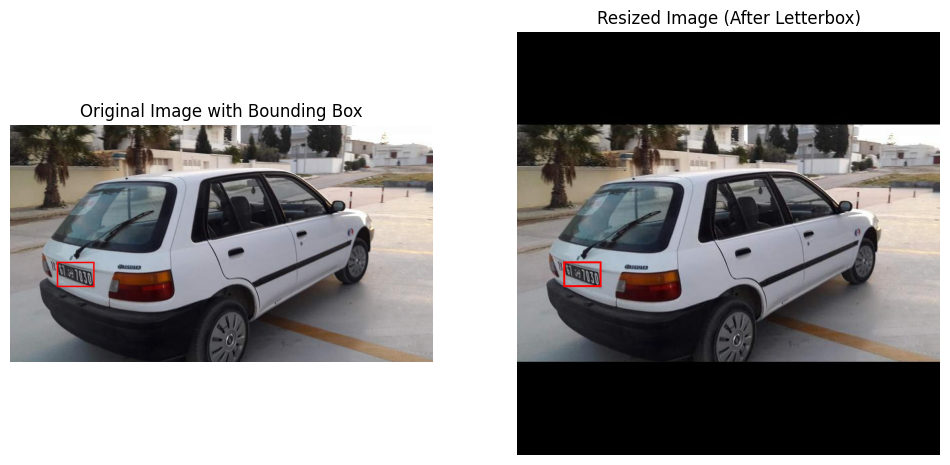

In [27]:
class SinglePlateVisualizer:
    """Class to visualize a single image before and after resizing with bounding boxes."""

    def __init__(self, images_folder, sorted_images_folder, license_bounds, sorted_bbox_df):
        self.images_folder = images_folder  # Original images
        self.sorted_images_folder = sorted_images_folder  # Resized images
        self.license_bounds = license_bounds  # Original bounding boxes
        self.sorted_bbox_df = sorted_bbox_df  # Resized bounding boxes

    def _get_bounding_box(self, df, img_name):
        """Fetch bounding box coordinates from a dataframe."""
        bbox_row = df[df["img_id"] == img_name]
        return bbox_row.iloc[0][["xmin", "ymin", "xmax", "ymax"]].tolist() if not bbox_row.empty else [0, 0, 0, 0]

    def _draw_bbox(self, img, bbox):
        """Draws a bounding box on the image."""
        img_with_bbox = img.copy()
        draw = ImageDraw.Draw(img_with_bbox)
        draw.rectangle(bbox, outline="red", width=3)
        return img_with_bbox

    def visualize(self, img_name, ax=None):
        """Display a single image before and after resizing with bounding boxes."""
        # Define paths
        original_img_path = os.path.join(self.images_folder, img_name)
        resized_img_path = os.path.join(self.sorted_images_folder, img_name)

        # Load images
        original_img = Image.open(original_img_path)
        resized_img = Image.open(resized_img_path)

        # Fetch bounding boxes
        orig_bbox = self._get_bounding_box(self.license_bounds, img_name)
        resized_bbox = self._get_bounding_box(self.sorted_bbox_df, img_name)

        # Draw bounding boxes
        original_img_with_bbox = self._draw_bbox(original_img, orig_bbox)
        resized_img_with_bbox = self._draw_bbox(resized_img, resized_bbox)

        # Display images (Use subplot if ax is provided)
        if ax is not None:
            ax[0].imshow(original_img_with_bbox)
            ax[0].set_title("Original Image with Bounding Box")
            ax[0].axis("off")

            ax[1].imshow(resized_img_with_bbox)
            ax[1].set_title("Resized Image (After Letterbox)")
            ax[1].axis("off")
        else:
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            axes[0].imshow(original_img_with_bbox)
            axes[0].set_title("Original Image with Bounding Box")
            axes[0].axis("off")

            axes[1].imshow(resized_img_with_bbox)
            axes[1].set_title("Resized Image (After Letterbox)")
            axes[1].axis("off")

            plt.show()

# Create an instance for single-image visualization
single_visualizer = SinglePlateVisualizer(images_folder, sorted_images_folder_detection, license_bounds, sorted_bbox_df)

# Display a single image
single_visualizer.visualize("1.jpg")


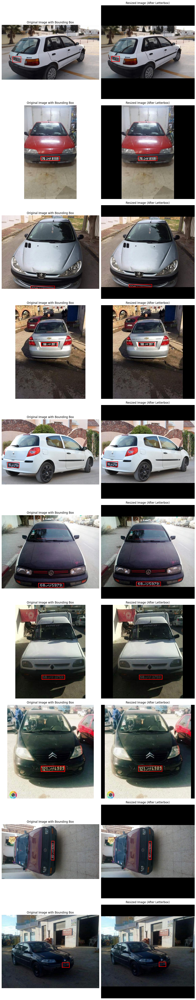

In [28]:
class MultiPlateVisualizer(SinglePlateVisualizer):
    """Class to visualize multiple images by reusing SinglePlateVisualizer."""

    def visualize_multiple(self, num_images=10):
        """Display multiple images before and after resizing with bounding boxes."""
        selected_images = self.sorted_bbox_df.iloc[:num_images]
        fig, axes = plt.subplots(num_images, 2, figsize=(12, 6 * num_images))

        for i, (_, row) in enumerate(selected_images.iterrows()):
            self.visualize(row['img_id'], ax=axes[i])

        plt.tight_layout()
        plt.show()


# Create an instance for multiple-image visualization
multi_visualizer = MultiPlateVisualizer(images_folder, sorted_images_folder_detection, license_bounds, sorted_bbox_df)

# Display multiple images
multi_visualizer.visualize_multiple(num_images=10)








In this step, we inspect the recognition plate images.
We visualize how the images  look before and after resizing the images to ensure they are still accurate.

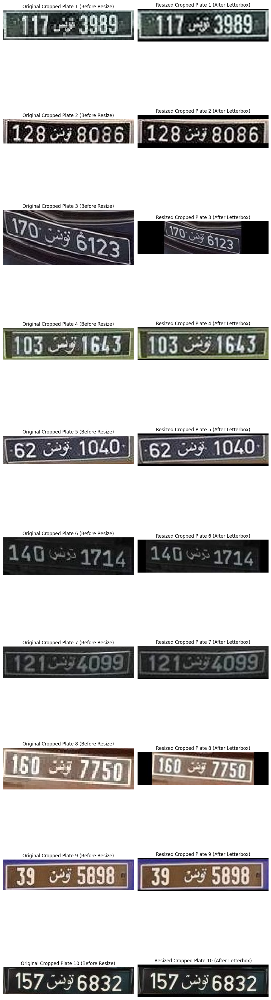

In [29]:


# Select first 10 images for visualization
num_images = 10
selected_images = sorted_df_recognition.iloc[:num_images]  # Already loaded

# Create a figure for visualization
fig, axes = plt.subplots(num_images, 2, figsize=(10, 4 * num_images))

for i, row in selected_images.iterrows():
    img_name = row['image_name']  # Image filename

    # Define paths for original and resized images
    original_img_path = os.path.join(license_regonition_images, img_name)  # Before resizing
    resized_img_path = os.path.join(sorted_images_folder_recognition, img_name)  # After resizing

    # Load images
    try:
        original_img = Image.open(original_img_path)
    except FileNotFoundError:
        original_img = None  # If original images are missing

    resized_img = Image.open(resized_img_path)

    # Display images side by side
    if original_img:
        axes[i, 0].imshow(original_img, cmap="gray")
        axes[i, 0].set_title(f"Original Cropped Plate {i+1} (Before Resize)")
        axes[i, 0].axis("off")
    else:
        axes[i, 0].set_title(f"Original Cropped Plate {i+1} Not Found")
        axes[i, 0].axis("off")

    axes[i, 1].imshow(resized_img, cmap="gray")
    axes[i, 1].set_title(f"Resized Cropped Plate {i+1} (After Letterbox)")
    axes[i, 1].axis("off")

plt.tight_layout()
plt.show()


##We print the first few entries from the recognition dataset to verify:

Image filenames (img_id)

Corresponding ground truth license plate text (text)

In [30]:
for _, row in recognition_character.iloc[:10].iterrows():  # Show first 10 samples
    print(f"Image: {row['img_id']}, Text: {row['text']}")


Image: 0.jpg, Text: 117T3989
Image: 1.jpg, Text: 128T8086
Image: 2.jpg, Text: 170T6123
Image: 3.jpg, Text: 103T1643
Image: 4.jpg, Text: 62T1040
Image: 5.jpg, Text: 140T1714
Image: 6.jpg, Text: 121T4099
Image: 7.jpg, Text: 160T7750
Image: 8.jpg, Text: 39T5898
Image: 9.jpg, Text: 157T6832


The ground truth texts contain the placeholder letter 'T', which represents the Arabic word 'تونس'.
We replace 'T' with 'تونس' and store the result in a new column called formatted_text.

This prepares the text for more accurate recognition training.

In [31]:
# Replace 'T' with 'تونس' in all rows and store in a new column
recognition_character['formatted_text'] = recognition_character['text'].apply(
    lambda x: ' '.join(x.replace('T', ' تونس ').split()) if 'T' in x else x
)

# Show the first 5 rows
recognition_character[['img_id', 'formatted_text']].head()


,img_id,formatted_text
0,0.jpg,117 تونس 3989
1,1.jpg,128 تونس 8086
2,2.jpg,170 تونس 6123
3,3.jpg,103 تونس 1643
4,4.jpg,62 تونس 1040


##Merge Image Metadata with Formatted Labels
We merge the sorted image metadata (sorted_df_recognition) with the formatted text labels (recognition_character) using the image filenames.

After merging:

We keep only image_name and the cleaned formatted_text

In [32]:
df_recognition = sorted_df_recognition.merge(
    recognition_character,
    left_on='image_name',
    right_on='img_id',
    how='inner'
)

# Drop 'img_id' and keep 'formatted_text' instead of 'text'
df_recognition = df_recognition[['image_name', 'formatted_text']]
df_recognition = df_recognition.rename(columns={'formatted_text': 'text'})


In [33]:
df_recognition.head()

,image_name,text
0,0.jpg,117 تونس 3989
1,1.jpg,128 تونس 8086
2,2.jpg,170 تونس 6123
3,3.jpg,103 تونس 1643
4,4.jpg,62 تونس 1040


#Detection Model Development(YOLOV8)


##  Create YOLO Folder Structure
In this section, we are creating directories where we will store the YOLO images and labels.

We define the paths for the YOLO dataset images and labels. Then, we use the os.makedirs() function to create the directories, ensuring that they exist before proceeding. If they already exist, exist_ok=True prevents errors.

##  Copy Resized Images to YOLO Image Folder
In this part, we are copying the resized images from the source folder to the YOLO image directory.

We extract the image names from the sorted_bbox_df dataframe and iterate over each image. The images are copied from the source folder (sorted_images_folder_detection) to the YOLO image directory (yolo_images_dir).


##  Convert Bounding Boxes to YOLO Format
Now, we convert the bounding box annotations to the YOLO format, which is the center coordinates and width/height normalized by the image dimensions.


For each image, we open it to extract its width and height. We then retrieve the bounding box coordinates (xmin, ymin, xmax, ymax) and convert these values into the YOLO format:

x_center and y_center represent the center of the bounding box normalized by the image width and height.

width and height are the dimensions of the bounding box, also normalized by the image dimensions.

We save these normalized values in a .txt file for each image, where the label 0 is the class ID (assuming only one class in this case).

In [34]:
# Step-1 Make YOLO folder structure
yolo_images_dir = '/content/yolo_dataset/images/train'
yolo_labels_dir = '/content/yolo_dataset/labels/train'

os.makedirs(yolo_images_dir, exist_ok=True)
os.makedirs(yolo_labels_dir, exist_ok=True)

# Step-2 Copy resized images to YOLO image folder


image_names = sorted_bbox_df['img_id'].tolist()
for img_name in tqdm(image_names):
    src_path = os.path.join(sorted_images_folder_detection, img_name)
    dst_path = os.path.join(yolo_images_dir, img_name)
    shutil.copy(src_path, dst_path)

# Step-3 Convert bounding boxes to YOLO format and save to .txt files
for _, row in sorted_bbox_df.iterrows():
    img_name = row['img_id']
    img_path = os.path.join(sorted_images_folder_detection, img_name)
    img = Image.open(img_path)
    img_w, img_h = img.size

    # Get bounding box
    xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']

    # Convert to YOLO format
    x_center = ((xmin + xmax) / 2) / img_w
    y_center = ((ymin + ymax) / 2) / img_h
    width = (xmax - xmin) / img_w
    height = (ymax - ymin) / img_h

    label_path = os.path.join(yolo_labels_dir, img_name.replace('.jpg', '.txt'))
    with open(label_path, 'w') as f:
        f.write(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")


100%|██████████| 900/900 [00:00<00:00, 4249.23it/s]


# Create YAML file for YOLOv8 training

In [35]:


yaml_content = """
path: /content/yolo_dataset
train: images/train
val: images/train  # You can split if you want later

nc: 1
names: ['license_plate']
"""

with open("license_plate.yaml", "w") as f:
    f.write(yaml_content)


# Check if the YAML file was created

In [36]:
!cat license_plate.yaml



path: /content/yolo_dataset
train: images/train
val: images/train  # You can split if you want later

nc: 1
names: ['license_plate']


#  Load YOLOv8 model

In [37]:
model = YOLO('yolov8n.pt')  # You can also try 'yolov8s.pt' or 'yolov8m.pt' later

# Train the model on your custom dataset
model.train(
    data='/content/license_plate.yaml',
    epochs=15,
    imgsz=640,
    batch=16,
    name='yolov8_license_plate',
    project='/content/yolo_training_results'
)


Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/license_plate.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/yolo_training_results, name=yolov8_license_plate3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

train: Scanning /content/yolo_dataset/labels/train.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/yolo_dataset/labels/train.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]


Plotting labels to /content/yolo_training_results/yolov8_license_plate3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/yolo_training_results/yolov8_license_plate3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.03G      1.226      2.819      1.125          4        640: 100%|██████████| 57/57 [00:18<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:06<00:00,  4.16it/s]


                   all        900        900      0.966      0.337       0.84      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10       2.5G       1.12       1.64       1.02          4        640: 100%|██████████| 57/57 [00:15<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:08<00:00,  3.62it/s]


                   all        900        900      0.948      0.955       0.98      0.674

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10       2.5G      1.106      1.304      1.019          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:10<00:00,  2.76it/s]


                   all        900        900      0.961      0.926       0.98      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10       2.5G      1.098      1.093       1.01          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:07<00:00,  3.64it/s]


                   all        900        900      0.954       0.96      0.984      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10       2.5G      1.089     0.9299     0.9914          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:07<00:00,  3.87it/s]


                   all        900        900      0.977      0.932      0.987      0.715

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.5G       1.01     0.8188     0.9722          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:06<00:00,  4.25it/s]


                   all        900        900      0.985      0.977      0.994      0.723

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       2.5G     0.9619     0.7472      0.953          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:08<00:00,  3.57it/s]


                   all        900        900      0.984      0.988      0.995      0.722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       2.5G     0.9274     0.6589     0.9494          4        640: 100%|██████████| 57/57 [00:14<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:07<00:00,  3.66it/s]


                   all        900        900      0.987       0.99      0.995      0.757

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10       2.5G     0.9079     0.6238     0.9249          4        640: 100%|██████████| 57/57 [00:17<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:14<00:00,  2.02it/s]


                   all        900        900      0.998      0.994      0.995      0.759

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10       2.5G     0.8714     0.5864     0.9232          4        640: 100%|██████████| 57/57 [00:19<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:07<00:00,  4.03it/s]


                   all        900        900      0.996      0.998      0.995      0.779

10 epochs completed in 0.070 hours.
Optimizer stripped from /content/yolo_training_results/yolov8_license_plate3/weights/last.pt, 6.2MB
Optimizer stripped from /content/yolo_training_results/yolov8_license_plate3/weights/best.pt, 6.2MB

Validating /content/yolo_training_results/yolov8_license_plate3/weights/best.pt...
Ultralytics 8.3.95 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:12<00:00,  2.34it/s]


                   all        900        900      0.996      0.998      0.995       0.78
Speed: 0.2ms preprocess, 2.4ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to /content/yolo_training_results/yolov8_license_plate3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79d16c71fc90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

# Display Training Results
In this step, we display the results of the YOLOv8 license plate detection model training. The results are saved as an image file, and we use the following code to visualize it:

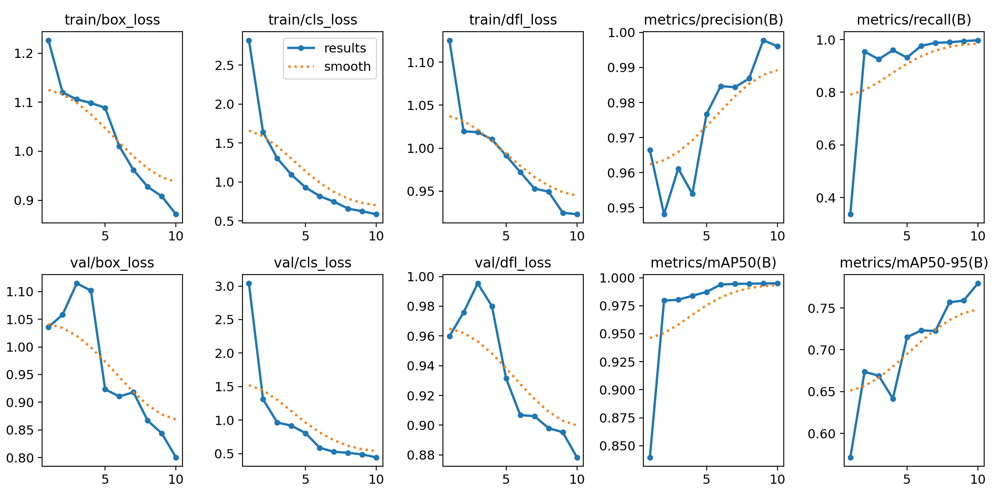

In [38]:
from IPython.display import Image, display
display(Image(filename="/content/yolo_training_results/yolov8_license_plate/results.png"))


for the recognition model required file are

df_recognition, images folder.

# Character Recognition with PaddleOCR
In this step, we use the PaddleOCR model to perform character recognition on the images. The code below demonstrates how we initialize PaddleOCR with the Arabic language setting, run the OCR on the images, and display the results for evaluation.


# Explanation:
# Initializing PaddleOCR:
The PaddleOCR model is initialized with the Arabic language setting (lang='ar') and the option to use an angle classifier (use_angle_cls=True). The angle classifier helps in detecting text in images where the text may be rotated or skewed.

# Image Loading and OCR Execution:
We iterate over the first 10 rows in the df_recognition dataframe. For each image, the image name (image_name) and the corresponding ground truth text (label_text) are extracted. The image is then loaded using OpenCV’s cv2.imread() method, and OCR is performed on the image by calling ocr.ocr(image_path, cls=True).

# Result Extraction:
The OCR result is parsed to extract the detected text. If valid results are found, we concatenate all the detected text lines into a single string (prediction). If no text is detected, the output is set to (No text detected).

# Displaying Results:
The image is displayed with a title showing the image name, the ground truth label (GT), and the OCR’s predicted text (OCR). This visualization allows for a quick comparison of how accurately the OCR model detected the text in the image. The image is shown without axis labels for better clarity.




[2025/03/24 16:52:58] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, use_gcu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/ml/Multilingual_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/arabic/arabic_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch

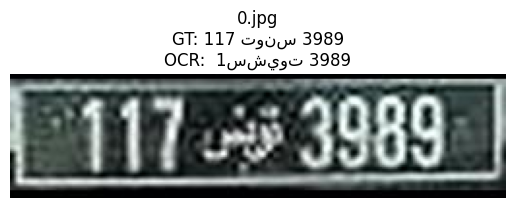

[2025/03/24 16:52:59] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.030098676681518555
[2025/03/24 16:52:59] ppocr DEBUG: cls num  : 3, elapsed : 0.03446459770202637
[2025/03/24 16:52:59] ppocr DEBUG: rec_res num  : 3, elapsed : 0.23800945281982422


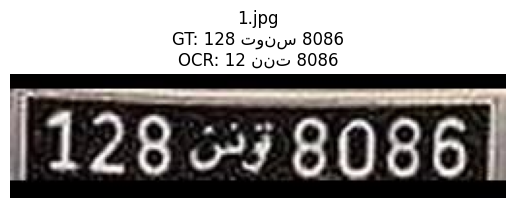

[2025/03/24 16:52:59] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.031243324279785156
[2025/03/24 16:52:59] ppocr DEBUG: cls num  : 3, elapsed : 0.014181375503540039
[2025/03/24 16:52:59] ppocr DEBUG: rec_res num  : 3, elapsed : 0.10046577453613281


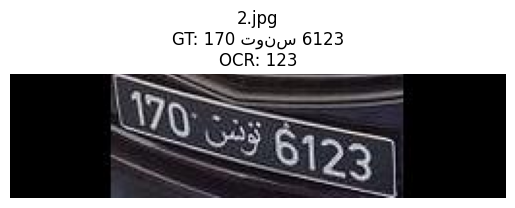

[2025/03/24 16:52:59] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.030364513397216797
[2025/03/24 16:52:59] ppocr DEBUG: cls num  : 3, elapsed : 0.014341592788696289
[2025/03/24 16:53:00] ppocr DEBUG: rec_res num  : 3, elapsed : 0.1045689582824707


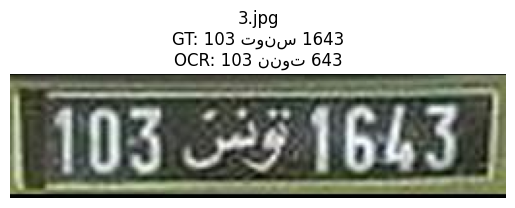

[2025/03/24 16:53:00] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.02448892593383789
[2025/03/24 16:53:00] ppocr DEBUG: cls num  : 3, elapsed : 0.015311717987060547
[2025/03/24 16:53:00] ppocr DEBUG: rec_res num  : 3, elapsed : 0.1039736270904541


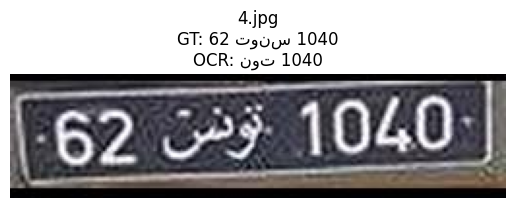

[2025/03/24 16:53:00] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.02610468864440918
[2025/03/24 16:53:00] ppocr DEBUG: cls num  : 3, elapsed : 0.013331174850463867
[2025/03/24 16:53:00] ppocr DEBUG: rec_res num  : 3, elapsed : 0.10040736198425293


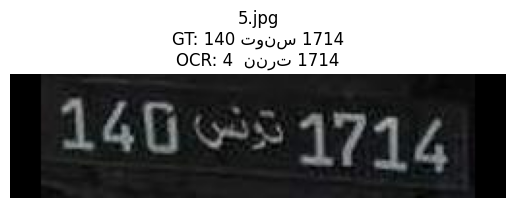

[2025/03/24 16:53:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025232315063476562
[2025/03/24 16:53:00] ppocr DEBUG: cls num  : 1, elapsed : 0.03099346160888672
[2025/03/24 16:53:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08439445495605469


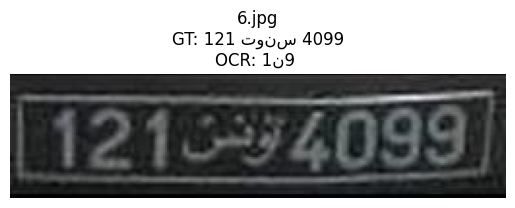

[2025/03/24 16:53:00] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.01956009864807129
[2025/03/24 16:53:00] ppocr DEBUG: cls num  : 3, elapsed : 0.03034496307373047
[2025/03/24 16:53:01] ppocr DEBUG: rec_res num  : 3, elapsed : 0.10975956916809082


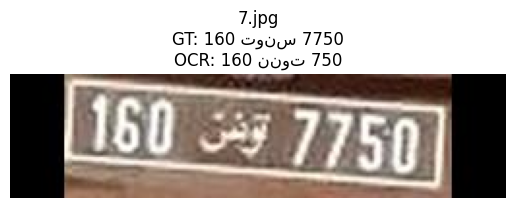

[2025/03/24 16:53:01] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.020171165466308594
[2025/03/24 16:53:01] ppocr DEBUG: cls num  : 3, elapsed : 0.014866828918457031
[2025/03/24 16:53:01] ppocr DEBUG: rec_res num  : 3, elapsed : 0.11310744285583496


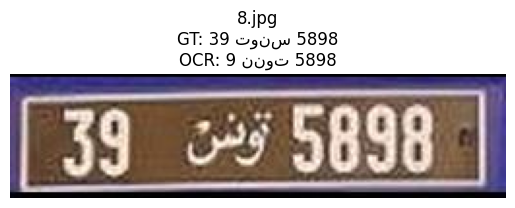

[2025/03/24 16:53:01] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.026083707809448242
[2025/03/24 16:53:01] ppocr DEBUG: cls num  : 3, elapsed : 0.01430201530456543
[2025/03/24 16:53:01] ppocr DEBUG: rec_res num  : 3, elapsed : 0.10242748260498047


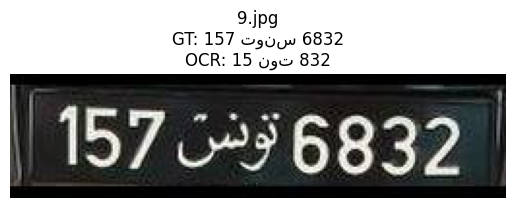

In [39]:
# Initialize PaddleOCR with Arabic language
ocr = PaddleOCR(use_angle_cls=True, lang='ar')

# Path to image folder
image_folder = '/content/Output/letterbox_recognition'

# Loop through first 10 rows of df_recognition to get image and label
for _, row in df_recognition.iloc[:10].iterrows():
    image_name = row["image_name"]
    label_text = row["text"]

    image_path = os.path.join(image_folder, image_name)
    img = cv2.imread(image_path)

    # Run OCR on image (optional, for comparison)
    result = ocr.ocr(image_path, cls=True)
    if result and isinstance(result[0], list):
        prediction = ' '.join([line[1][0] for line in result[0]])
    else:
        prediction = '[No text detected]'

    # Show image with both Ground Truth and OCR prediction
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"{image_name}\nGT: {label_text}\nOCR: {prediction}")
    plt.axis('off')
    plt.show()


# Character Recognition with EasyOCR
In this step, we use the EasyOCR model to perform character recognition on the images. EasyOCR supports multiple languages, and here we initialize it with both Arabic and Latin languages to recognize text in the images.

# Explanation:
# Initializing EasyOCR:
The easyocr.Reader is initialized with Arabic ('ar') and English ('en') language settings, enabling the model to recognize text in both languages. The gpu=False setting ensures that the model runs on the CPU.

# Processing Images:
The code loops through the first 10 rows of the df_recognition dataframe. For each image, the image name (image_name) and the corresponding ground truth text (gt_text) are retrieved. The image is loaded using OpenCV, and the OCR is performed with the reader.readtext(image_path) function. This function returns the detected text lines from the image.

# Joining Predictions:
The OCR result consists of a list of detected text lines. If any text is detected, the lines are joined into a single string (prediction). If no text is detected, the output is set to (No text detected).

# Displaying Results:
The image is displayed using Matplotlib, with the title showing the image name, the ground truth text (GT), and the OCR’s predicted text (OCR). The axis is turned off for a cleaner display.

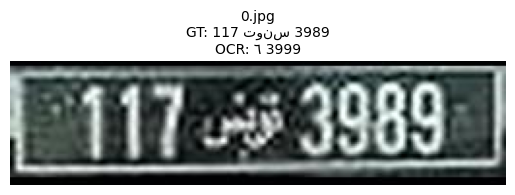

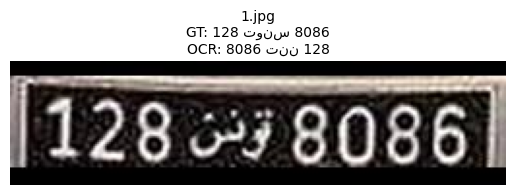

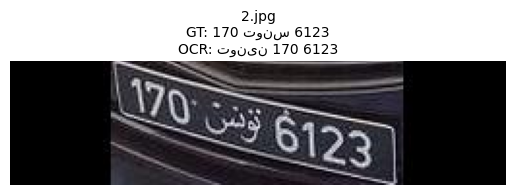

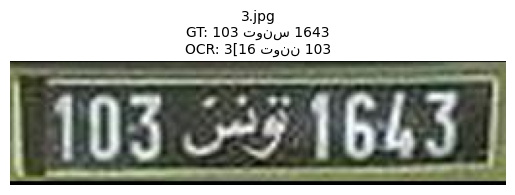

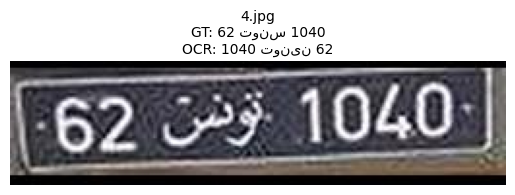

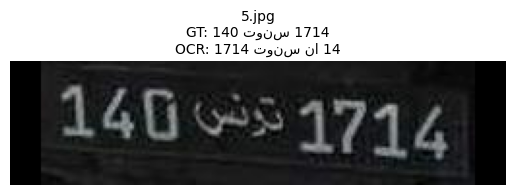

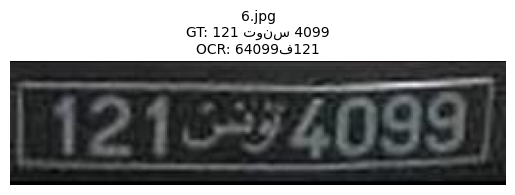

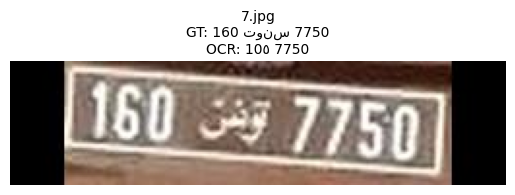

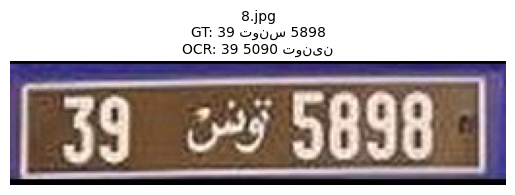

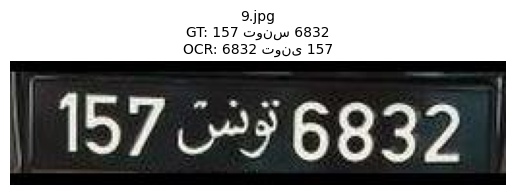

In [40]:
# Initialize EasyOCR reader with Arabic and Latin languages
reader = easyocr.Reader(['ar', 'en'], gpu=False)

# Image directory
image_folder = '/content/Output/letterbox_recognition'

# Show results for first 10 images
for _, row in df_recognition.head(10).iterrows():
    image_name = row['image_name']
    gt_text = row['text']  # Ground Truth text
    image_path = os.path.join(image_folder, image_name)

    # Run OCR
    result = reader.readtext(image_path, detail=0)

    # Join prediction lines
    prediction = ' '.join(result) if result else '[No text detected]'

    # Load image
    img = cv2.imread(image_path)

    # Display with Matplotlib
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"{image_name}\nGT: {gt_text}\nOCR: {prediction}", fontsize=10)
    plt.axis('off')
    plt.show()


## Preparing Vocabulary for Character Recognition
In this step, we extract all unique characters from the text column in the df_recognition dataframe and prepare a vocabulary to be used with the ViTSTR model. The vocabulary is created by adding special tokens required for the CTC (Connectionist Temporal Classification) loss function, which is commonly used for sequence-to-sequence tasks like text recognition.

## Explanation:

**Unique Character Extraction**: We combine all text into a single string and extract unique characters.

**Vocabulary Creation**: Special tokens [BLANK] and [PAD] are added for CTC. The complete vocabulary is a list of unique characters.

**Character Mappings**: We create two dictionaries: char_to_idx (for encoding characters) and idx_to_char (for decoding).

**Sanity Checks**: We ensure the [BLANK] token is at index 0 and [PAD] at index 1.

**Summary**: We print the vocabulary size and a sample of the mappings.

In [41]:
# Extract all unique characters from the text column
all_text = ''.join(df_recognition['text'].astype(str).tolist())  # Ensures all are strings
unique_chars = sorted(set(all_text))

# Add special tokens for CTC
vocab = ['[BLANK]', '[PAD]'] + unique_chars  # [BLANK]=0, [PAD]=1

# Build mappings
char_to_idx = {char: idx for idx, char in enumerate(vocab)}
idx_to_char = {idx: char for char, idx in char_to_idx.items()}

# Sanity checks
assert char_to_idx['[BLANK]'] == 0, "CTC requires [BLANK] to be index 0"
assert char_to_idx['[PAD]'] == 1, "Padding index is expected to be 1"

# Print summary
print(" Vocabulary size:", len(vocab))
print(" Sample mapping:", dict(list(char_to_idx.items())[:10]))


 Vocabulary size: 18
 Sample mapping: {'[BLANK]': 0, '[PAD]': 1, ' ': 2, '0': 3, '1': 4, '2': 5, '3': 6, '4': 7, '5': 8, '6': 9}


## Defining the Dataset for Character Recognition
In this step, we define a custom PyTorch Dataset class called LicensePlateDataset. This class is used to load images and their corresponding labels, while also applying necessary transformations to the images and encoding the labels for the model.

# Explanation:
## __init__ Method:
Initializes the dataset with the given dataframe, image directory, and character-to-index mapping (char_to_idx). It also sets up default image transformations if none are provided, such as resizing the image and normalizing the pixel values.

#__len__ Method:
Returns the number of samples in the dataset (i.e., the number of rows in the dataframe).

# encode_text Method:
Converts the text labels into a list of indices, where each character is mapped to its corresponding index in the char_to_idx dictionary. Special tokens like [PAD] are used if characters are not found.

#__getitem__ Method:
Loads an image and its corresponding label for a given index (idx). The image is opened, transformed into a tensor, and the text label is encoded as a tensor of indices.



In [42]:


class LicensePlateDataset(Dataset):
    def __init__(self, dataframe, image_dir, char_to_idx, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.char2idx = char_to_idx

        self.transform = transform if transform else transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])

    def __len__(self):
        return len(self.dataframe)

    def encode_text(self, text):
        # Convert each character to index (skip [PAD], [BLANK] here)
        return [self.char2idx.get(c, self.char2idx['[PAD]']) for c in text]

    def __getitem__(self, idx):
        image_name = self.dataframe.loc[idx, 'image_name']
        label_text = self.dataframe.loc[idx, 'text']

        image_path = f"{self.image_dir}/{image_name}"
        image = Image.open(image_path).convert("RGB")
        image_tensor = self.transform(image)

        label_encoded = torch.tensor(self.encode_text(label_text), dtype=torch.long)

        return image_tensor, label_encoded


## Custom Collate Function for Data Loading
The collate_fn function is used to process a batch of data during training. It ensures that the images and labels are correctly padded and formatted for input to the ViTSTR model.

# Explanation:
# Extracting Images and Labels:
The function first separates the images and labels from the batch. It uses zip(*batch) to unpack them and then stacks the images into a single tensor using torch.stack().

# Label Lengths:
The length of each label (text) is computed before padding and stored in label_lengths. This is necessary for the CTC loss to know the actual length of each label.

# Padding Labels:
The labels are padded to ensure all sequences in the batch have the same length. This is done using nn.utils.rnn.pad_sequence(), with the padding value set to the index of [PAD] from the vocabulary.

# Input Lengths for CTC:
For CTC, we need to provide the length of the input sequences (the number of patches in the image). We assume that the ViT model's patch size is 16 and the image width is 224, resulting in 197 patches (14x14 grid + 1 CLS token). This length is stored in input_lengths.

# Return:
The function returns:

images: The batch of images.

labels_padded: The padded labels.

input_lengths: The lengths of the input sequences (patches).

label_lengths: The lengths of the original labels (before padding).



In [43]:
def collate_fn(batch):
    images, labels = zip(*batch)  # labels are already encoded tensors from Dataset
    images = torch.stack(images)

    # Actual label lengths (before padding)
    label_lengths = torch.tensor([len(label) for label in labels], dtype=torch.long)

    # Pad labels to form a batch tensor
    labels_padded = nn.utils.rnn.pad_sequence(labels, batch_first=True, padding_value=char_to_idx['[PAD]'])

    # Input lengths for CTC (T = sequence length from model)
    # Assuming ViT patch size = 16 and image width = 224, 224/16 = 14 x 14 = 196 patches + 1 CLS token = 197
    input_lengths = torch.full(size=(len(images),), fill_value=197, dtype=torch.long)

    return images, labels_padded, input_lengths, label_lengths


# Creating the Dataset and DataLoader
In this step, we create a LicensePlateDataset instance and a DataLoader to efficiently load and batch the data for training.

# Explanation:
# Dataset:
The LicensePlateDataset is initialized with the dataframe, image directory, and character-to-index mapping. It prepares the data for training.

# DataLoader:
A DataLoader is created to handle batching. It:

Loads the data in batches of 16 images.

Shuffles the data for better generalization.

Uses the collate_fn to pad labels and format the data correctly for training.

In [44]:
dataset = LicensePlateDataset(df_recognition, '/content/Output/letterbox_recognition', char_to_idx)

train_loader = DataLoader(
    dataset, batch_size=16, shuffle=True, collate_fn=collate_fn
)



# Decoding Predicted Indices to Text
The decode_indices function is used to convert a sequence of indices (predictions) back into readable text by mapping each index to its corresponding character.


# Explanation:
# Index to Character Mapping:
The function iterates through the list of indices, using idx_to_char to convert each index to its corresponding character.

# Filter Special Tokens:
It skips special tokens ([PAD], [BLANK]) to ensure they don't appear in the decoded text.

# Join Characters:
The valid characters are joined together into a single string to form the decoded text.

In [45]:
def decode_indices(indices):
    chars = [idx_to_char.get(idx, '') for idx in indices if idx_to_char.get(idx) not in ['[PAD]', '[BLANK]']]
    return ''.join(chars)



# Defining the ViTSTR Model
The ViTSTR class defines the model architecture for ViT-based text recognition using a pre-trained Vision Transformer (ViT) backbone.

# Explanation:
# Backbone:
The model uses a pre-trained Vision Transformer (ViT) model (specifically, vit_small_patch16_224) without the final classification head. This allows us to leverage the transformer’s ability to learn rich feature representations of image patches.

# Classifier:
A fully connected layer (fc) is used to convert the ViT features (patch embeddings) into character logits. The number of output classes (num_classes) corresponds to the total number of characters in the vocabulary.

# Forward Pass:

features = self.backbone.forward_features(x): Extracts feature embeddings from the image input.

out = self.fc(features): Converts the embeddings to character logits.

out = out.permute(1, 0, 2): Rearranges the tensor to shape (T, B, C), which is required for CTC loss, where:

T is the sequence length (number of patches),

B is the batch size,

C is the number of classes (characters).



In [46]:
class ViTSTR(nn.Module):
    def __init__(self, num_classes, hidden_dim=384):
        super(ViTSTR, self).__init__()

        # Load pretrained ViT with NO classification head
        self.backbone = timm.create_model(
            'vit_small_patch16_224',
            pretrained=True,
            num_classes=0  # Important: we don't want final classification head
        )

        # Classifier to convert each patch embedding to character logits
        self.fc = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        features = self.backbone.forward_features(x)  # Shape: (B, N, hidden_dim)
        out = self.fc(features)                       # Shape: (B, N, num_classes)
        out = out.permute(1, 0, 2)                    # Shape: (T=N, B, C) → for CTC
        return out


In [47]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)


In this step, we initialize the ViTSTR model and move it to the appropriate device (e.g., CPU or GPU) for training.

In [48]:
num_classes = len(char_to_idx)
model = ViTSTR(num_classes=num_classes)
model = model.to(device)


## Generating Outputs and Applying Log-Softmax
In this step, we pass the images through the ViTSTR model to obtain predictions and apply log-softmax to prepare the outputs for CTC loss calculation.

In [49]:
from PIL import Image


images, labels_padded, input_lengths, label_lengths = next(iter(train_loader))

# Move to device
images = images.to(device)
labels_padded = labels_padded.to(device)
input_lengths = input_lengths.to(device)
label_lengths = label_lengths.to(device)

# Now pass it to the model
outputs = model(images)
print("Output shape:", outputs.shape)  # Should be (T, B, C)

log_probs = F.log_softmax(outputs, dim=2)  #  This will now work


Output shape: torch.Size([197, 16, 18])


# Decoding Predictions with CTC
The ctc_decode function is used to decode the predicted logits from the model into readable text by using CTC decoding.

# Explanation:
# Extracting Predicted Characters:
The function starts by using torch.argmax(logits, dim=2) to find the most likely character for each time step (T). It then permutes the output to shape (B, T).

# Decoding Each Sequence:

For each sequence (image in the batch), it iterates over the predicted indices (seq).

It maps each index to a character using idx_to_char, skipping the [BLANK] token and avoiding consecutive duplicate characters (as per CTC decoding rules).

Storing the Decoded Results:
The decoded characters are joined into a string and stored in the results list, which is returned as the final decoded text.

In [50]:
def ctc_decode(logits, idx_to_char, blank_idx=0):
    probs = torch.argmax(logits, dim=2).permute(1, 0)  # (B, T)
    results = []

    for seq in probs:
        decoded = []
        prev = None
        for idx in seq:
            idx = idx.item()
            char = idx_to_char.get(idx, '')
            if idx != blank_idx and idx != prev:
                decoded.append(char)
            prev = idx
        results.append(''.join(decoded))

    return results


#Decoding Log-Probabilities
In this step, the log-probabilities output from the model are decoded into human-readable text using the ctc_decode function.

In [51]:
decoded = ctc_decode(log_probs, idx_to_char, blank_idx=char_to_idx['[BLANK]'])


 # Setting Up Loss, Optimizer, and Learning Rate Scheduler
In this step, we define the CTC loss function, the optimizer, and the learning rate scheduler for model training.

In [52]:
# Loss
criterion = nn.CTCLoss(blank=char_to_idx['[BLANK]'], zero_infinity=True)


# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.8)



## Training the Model
The train_model function handles the training process for the ViTSTR model. It performs forward passes, computes CTC loss, and updates the model’s parameters using backpropagation.

# Explanation:
# Epoch Loop:
The model is trained over multiple epochs. In each epoch, the model is set to train mode, and loss is accumulated over batches.

# Data Iteration:
For each batch in the train_loader, images, labels, input lengths, and label lengths are moved to the appropriate device (GPU/CPU).

# Forward Pass:
The model generates predictions (outputs), which are then converted to log-probabilities using log_softmax. These probabilities are used to compute the CTC loss.

# Loss Calculation and Backpropagation:
The loss is computed using the CTC loss function, and the gradients are backpropagated (loss.backward()) to update the model parameters.

# Model Evaluation (Preview):
After each epoch, the model is set to eval mode. The function previews predictions from the first batch by decoding the model’s outputs using CTC decoding. It shows a few predicted results for manual inspection.

# Output:
The function prints the average loss at the end of each epoch and returns the trained model.

In [53]:


def train_model(model, train_loader, criterion, optimizer, device, idx_to_char, char_to_idx, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0

        for images, labels, input_lengths, label_lengths in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images = images.to(device)
            labels = labels.to(device)
            input_lengths = input_lengths.to(device)
            label_lengths = label_lengths.to(device)

            optimizer.zero_grad()

            # Forward pass
            outputs = model(images)  # (T, B, C)
            log_probs = F.log_softmax(outputs, dim=2)  # Apply log_softmax for CTC

            # Compute CTC Loss
            loss = criterion(log_probs, labels, input_lengths, label_lengths)

            # Backpropagation
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        print(f" Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

        # Optional: Preview predictions from first batch
        model.eval()
        with torch.no_grad():
            for images, labels, input_lengths, label_lengths in train_loader:
                images = images.to(device)
                outputs = model(images)
                log_probs = F.log_softmax(outputs, dim=2)
                preds = torch.argmax(log_probs, dim=2).permute(1, 0)  # (B, T)

                results = []
                for seq in preds:
                    prev = None
                    decoded = []
                    for idx in seq:
                        idx = idx.item()
                        if idx != char_to_idx['[BLANK]'] and idx != prev:
                            decoded.append(idx_to_char.get(idx, ''))
                        prev = idx
                    results.append(''.join(decoded))

                print(" Sample Predictions:")
                for i in range(min(5, len(results))):
                    print(f" Predicted: {results[i]}")
                break  # Preview 1 batch only

    return model


**train_model Function**: This function is responsible for the entire training process of the ViTSTR model.

# Purpose:
This step triggers the training loop, where:

The model is trained for 20 epochs on the given dataset.

The CTC loss is computed, and the model’s parameters are updated after each batch.

The model is evaluated periodically, and predictions are printed to monitor its progress.

# Outcome:
trained_model: The trained version of the ViTSTR model, which has learned to perform character recognition on license plates from the provided dataset.


In [54]:
trained_model = train_model(
    model=model,
    train_loader=train_loader,
    criterion=criterion,
    optimizer=optimizer,
    device=device,
    idx_to_char=idx_to_char,
    char_to_idx=char_to_idx,
    num_epochs=32
)


Epoch 1/32: 100%|██████████| 57/57 [00:10<00:00,  5.20it/s]


 Epoch 1/32, Average Loss: 5.1303
 Sample Predictions:
 Predicted:   
 Predicted:   
 Predicted: 
 Predicted:   
 Predicted:  


Epoch 2/32: 100%|██████████| 57/57 [00:11<00:00,  5.06it/s]


 Epoch 2/32, Average Loss: 2.3447
 Sample Predictions:
 Predicted:    
 Predicted:     
 Predicted:  
 Predicted:   
 Predicted:    


Epoch 3/32: 100%|██████████| 57/57 [00:11<00:00,  5.06it/s]


 Epoch 3/32, Average Loss: 1.9742
 Sample Predictions:
 Predicted: 1 ت
 Predicted: 1ت
 Predicted: 1  و
 Predicted: 1  
 Predicted: 1تت


Epoch 4/32: 100%|██████████| 57/57 [00:10<00:00,  5.36it/s]


 Epoch 4/32, Average Loss: 1.7708
 Sample Predictions:
 Predicted: 1 تونس8
 Predicted: 1تتونس
 Predicted: 11تونس22
 Predicted: 1 تونس2
 Predicted: 11ت  ونس22


Epoch 5/32: 100%|██████████| 57/57 [00:10<00:00,  5.50it/s]


 Epoch 5/32, Average Loss: 1.6129
 Sample Predictions:
 Predicted: 1تونس23
 Predicted: 1 ننس
 Predicted: 1  ونس1
 Predicted: 1ت ونس25
 Predicted: 1  ونس13


Epoch 6/32: 100%|██████████| 57/57 [00:10<00:00,  5.46it/s]


 Epoch 6/32, Average Loss: 1.5168
 Sample Predictions:
 Predicted: 117 تونس 744
 Predicted: 11ت ونس   474
 Predicted: 11 تونس 74
 Predicted: 11 ت ونس 434
 Predicted: 117 ت ونس 834


Epoch 7/32: 100%|██████████| 57/57 [00:10<00:00,  5.24it/s]


 Epoch 7/32, Average Loss: 1.4399
 Sample Predictions:
 Predicted: 1 تونس 21
 Predicted: 17  ونس 271
 Predicted: 1تونس 29
 Predicted: 11 ت تونس 23
 Predicted: 17 تونس 29


Epoch 8/32: 100%|██████████| 57/57 [00:10<00:00,  5.39it/s]


 Epoch 8/32, Average Loss: 1.4146
 Sample Predictions:
 Predicted: 1تونس 1109
 Predicted: 1 تونس 771
 Predicted: 11 تونس 171
 Predicted: 11 ونس 16
 Predicted: 1 تونس 179


Epoch 9/32: 100%|██████████| 57/57 [00:10<00:00,  5.32it/s]


 Epoch 9/32, Average Loss: 1.3697
 Sample Predictions:
 Predicted: 11 تونس 111
 Predicted: 10 تونس 191
 Predicted: 1 تونس 606
 Predicted: 1 تونس 29
 Predicted: 11  تونس 414


Epoch 10/32: 100%|██████████| 57/57 [00:10<00:00,  5.27it/s]


 Epoch 10/32, Average Loss: 1.2970
 Sample Predictions:
 Predicted: 15 تونس 133
 Predicted: 18 تونس 1038
 Predicted: 11 تونس 133
 Predicted: 16  ونس 19
 Predicted: 131 تتونس 139


Epoch 11/32: 100%|██████████| 57/57 [00:10<00:00,  5.30it/s]


 Epoch 11/32, Average Loss: 1.3040
 Sample Predictions:
 Predicted: 10 تونس 4044
 Predicted: 18 تتونس 669
 Predicted: 77 تونس244
 Predicted: 12 تونس 244
 Predicted: 11 تونس 2834


Epoch 12/32: 100%|██████████| 57/57 [00:10<00:00,  5.40it/s]


 Epoch 12/32, Average Loss: 1.2175
 Sample Predictions:
 Predicted: 16 تونس 9199
 Predicted: 12 تونس 221
 Predicted: 10 تونس 2134
 Predicted: 130 تونس 6939
 Predicted: 14 تونس 9933


Epoch 13/32: 100%|██████████| 57/57 [00:10<00:00,  5.44it/s]


 Epoch 13/32, Average Loss: 1.1278
 Sample Predictions:
 Predicted: 11 تونس 4144
 Predicted: 17 تونس  7724
 Predicted: 8 تونس 5909
 Predicted: 8 تونس 599
 Predicted: 14 تونس 110


Epoch 14/32: 100%|██████████| 57/57 [00:10<00:00,  5.39it/s]


 Epoch 14/32, Average Loss: 1.0601
 Sample Predictions:
 Predicted: 111 تونس 774
 Predicted: 15 تونس 113
 Predicted: 135 تونس 11
 Predicted: 12 تونس 2728
 Predicted: 132 تونس 279


Epoch 15/32: 100%|██████████| 57/57 [00:10<00:00,  5.36it/s]


 Epoch 15/32, Average Loss: 0.9909
 Sample Predictions:
 Predicted: 82 تونس 229
 Predicted: 1361 تونس 474
 Predicted: 12 تونس 212
 Predicted: 172 تونس 9390
 Predicted: 95 تونس422


Epoch 16/32: 100%|██████████| 57/57 [00:10<00:00,  5.36it/s]


 Epoch 16/32, Average Loss: 0.8694
 Sample Predictions:
 Predicted: 135 تونس 3333
 Predicted: 15 تونس 5722
 Predicted: 89 تونس8407
 Predicted: 121 تونس 237
 Predicted: 13 تونس 9634


Epoch 17/32: 100%|██████████| 57/57 [00:10<00:00,  5.35it/s]


 Epoch 17/32, Average Loss: 0.6931
 Sample Predictions:
 Predicted: 103 تونس 14
 Predicted: 188 تونس 4228
 Predicted: 138 تونس 66
 Predicted: 12 تونس 847
 Predicted: 72 تونس 7988


Epoch 18/32: 100%|██████████| 57/57 [00:10<00:00,  5.33it/s]


 Epoch 18/32, Average Loss: 0.5384
 Sample Predictions:
 Predicted: 140 تونس 4408
 Predicted: 161 تونس 3015
 Predicted: 92 تونس 8699
 Predicted: 179 تونس 7121
 Predicted: 114 تونس 734


Epoch 19/32: 100%|██████████| 57/57 [00:10<00:00,  5.33it/s]


 Epoch 19/32, Average Loss: 0.5666
 Sample Predictions:
 Predicted: 15 تونس 5755
 Predicted: 163 تونس 86847
 Predicted: 114 تونس 880
 Predicted: 82 تونس 148
 Predicted: 889 تونس 4187


Epoch 20/32: 100%|██████████| 57/57 [00:10<00:00,  5.39it/s]


 Epoch 20/32, Average Loss: 0.3613
 Sample Predictions:
 Predicted: 12 تونس 8467
 Predicted: 30 تونس 8341
 Predicted: 182 تونس 1735
 Predicted: 153 تونس 3296
 Predicted: 15 تونس 5667


Epoch 21/32: 100%|██████████| 57/57 [00:10<00:00,  5.35it/s]


 Epoch 21/32, Average Loss: 0.2802
 Sample Predictions:
 Predicted: 11 تونس 2799
 Predicted: 147 7تونس 777
 Predicted: 157 تونس 6832
 Predicted: 111 تون 5779
 Predicted: 65 تونس 3230


Epoch 22/32: 100%|██████████| 57/57 [00:10<00:00,  5.33it/s]


 Epoch 22/32, Average Loss: 0.2192
 Sample Predictions:
 Predicted: 19 تونس 140
 Predicted: 110 تونس 2456
 Predicted: 135 تونس 532
 Predicted: 115 تونس 7637
 Predicted: 132 تونس 3848


Epoch 23/32: 100%|██████████| 57/57 [00:10<00:00,  5.35it/s]


 Epoch 23/32, Average Loss: 0.1522
 Sample Predictions:
 Predicted: 76 تونس 2714
 Predicted: 157 ونس  682
 Predicted: 135 تونس 332
 Predicted: 19 تونس 7951
 Predicted: 165 تونس 895


Epoch 24/32: 100%|██████████| 57/57 [00:10<00:00,  5.37it/s]


 Epoch 24/32, Average Loss: 0.1480
 Sample Predictions:
 Predicted: 62 تونس 9920
 Predicted: 153 تونس 3296
 Predicted: 140 تونس 5408
 Predicted: 10 تونس 32729
 Predicted: 167 تونس 5102


Epoch 25/32: 100%|██████████| 57/57 [00:10<00:00,  5.37it/s]


 Epoch 25/32, Average Loss: 0.1487
 Sample Predictions:
 Predicted: 74 تونس 5775
 Predicted: 118 تونس 959
 Predicted: 112 تونس 876
 Predicted: 120 تونس 8917
 Predicted: 81 تونس 401


Epoch 26/32: 100%|██████████| 57/57 [00:10<00:00,  5.36it/s]


 Epoch 26/32, Average Loss: 0.1199
 Sample Predictions:
 Predicted: 92 تونس 3839
 Predicted: 131 تونس 954
 Predicted: 89 تونس 4187
 Predicted: 141 تونس 9185
 Predicted: 37 تونس 3819


Epoch 27/32: 100%|██████████| 57/57 [00:10<00:00,  5.34it/s]


 Epoch 27/32, Average Loss: 0.0805
 Sample Predictions:
 Predicted: 174 تونس 4999
 Predicted: 175 تونس 7944
 Predicted: 105 تونس 4424
 Predicted: 118 تونس 9630
 Predicted: 165 تونس 895


Epoch 28/32: 100%|██████████| 57/57 [00:10<00:00,  5.37it/s]


 Epoch 28/32, Average Loss: 0.0761
 Sample Predictions:
 Predicted: 138 تونس 1769
 Predicted: 12 تونس 7367
 Predicted: 73 تونس 4019
 Predicted: 94 تونس 8974
 Predicted: 115 تونس 5367


Epoch 29/32: 100%|██████████| 57/57 [00:10<00:00,  5.37it/s]


 Epoch 29/32, Average Loss: 0.0589
 Sample Predictions:
 Predicted: 133 تونس 9146
 Predicted: 194 تونس 3593
 Predicted: 96 تونس 3734
 Predicted: 149 تونس 3297
 Predicted: 153 تونس 3222


Epoch 30/32: 100%|██████████| 57/57 [00:10<00:00,  5.35it/s]


 Epoch 30/32, Average Loss: 0.0255
 Sample Predictions:
 Predicted: 119 تونس 2123
 Predicted: 129 تونس 9084
 Predicted: 103 تونس 1451
 Predicted: 137 تونس 2499
 Predicted: 77 تونس 7035


Epoch 31/32: 100%|██████████| 57/57 [00:10<00:00,  5.36it/s]


 Epoch 31/32, Average Loss: 0.0177
 Sample Predictions:
 Predicted: 55 تتونس 2527
 Predicted: 90 تونس 3095
 Predicted: 154 تونس 7332
 Predicted: 194 تونس 558
 Predicted: 131 تونس 8840


Epoch 32/32: 100%|██████████| 57/57 [00:10<00:00,  5.34it/s]

 Epoch 32/32, Average Loss: 0.0254
 Sample Predictions:
 Predicted: 171 تونس 2151
 Predicted: 12ت2 ونس 7105
 Predicted: 70 تونس 6552
 Predicted: 153 تونس 3222
 Predicted: 1691 تونس 9685


In [55]:
torch.save(model.state_dict(), "vitstr_ctc_license_plate.pth")


#Explanation:
This function evaluates the trained ViTSTR model using several metrics, including exact match accuracy, character-level accuracy, and generates confusion matrices to visualize misclassifications.

#Key Steps:

#Model Evaluation:

The model is set to evaluation mode (model.eval()).

Predictions are made by feeding the test images through the model, and the logits are converted to probabilities using log softmax.

Predictions are decoded from the output indices into text strings for comparison with the ground truth labels.

#Metrics:

Exact Match Accuracy: Measures how often the predicted text matches the ground truth exactly.

Character-Level Accuracy: Computes the character-level accuracy between predicted and actual text using SequenceMatcher.

# Storing Results:

Predictions and ground truths are saved to a CSV file (ocr_predictions_vs_truth.csv).

A confusion matrix is created for a detailed breakdown of label misclassifications, stored in ocr_confusion_matrix_full_labels.csv.

# Mismatch Analysis:

A mismatch counter is used to identify and print the top 10 most frequent misclassifications, showing where the model struggled the most.

# Outcome:
The function provides a detailed performance evaluation of the model, generating accuracy metrics, a confusion matrix, and a list of the most common misclassifications to guide further improvements in the model.

In [56]:


def evaluate_model_full_metrics(model, dataloader, char_to_idx, idx_to_char, device):
    model.eval()
    total_exact = 0
    total_samples = 0
    total_char_accuracy = 0.0
    all_preds = []
    all_truths = []

    with torch.no_grad():
        for images, labels, input_lengths, label_lengths in dataloader:
            images = images.to(device)

            outputs = model(images)  # (T, B, C)
            log_probs = torch.nn.functional.log_softmax(outputs, dim=2)
            preds = torch.argmax(log_probs, dim=2).permute(1, 0)  # (B, T)

            for i in range(len(preds)):
                pred_seq = preds[i]
                true_seq = labels[i][:label_lengths[i]]

                # Decode prediction
                pred_str = []
                prev = None
                for idx in pred_seq:
                    idx = idx.item()
                    if idx != char_to_idx['[BLANK]'] and idx != prev:
                        pred_str.append(idx_to_char.get(idx, ''))
                    prev = idx
                pred_str = ''.join(pred_str)

                # Decode ground truth
                true_str = ''.join([idx_to_char[idx.item()] for idx in true_seq])

                # Accuracy
                if pred_str == true_str:
                    total_exact += 1

                # Character-level accuracy
                char_acc = SequenceMatcher(None, pred_str, true_str).ratio()
                total_char_accuracy += char_acc

                total_samples += 1
                all_preds.append(pred_str)
                all_truths.append(true_str)

    # Accuracy metrics
    overall_accuracy = total_exact / total_samples * 100
    avg_char_accuracy = total_char_accuracy / total_samples * 100
    print(f" Exact Match Accuracy: {overall_accuracy:.2f}%")
    print(f" Character-Level Accuracy: {avg_char_accuracy:.2f}%")

    # Save predictions to CSV
    df = pd.DataFrame({
        'Prediction': all_preds,
        'Ground Truth': all_truths
    })
    df.to_csv("ocr_predictions_vs_truth.csv", index=False)

    # Confusion matrix as DataFrame (label-level)
    unique_labels = sorted(set(all_truths + all_preds))
    conf_mat = confusion_matrix(all_truths, all_preds, labels=unique_labels)
    conf_df = pd.DataFrame(conf_mat, index=unique_labels, columns=unique_labels)
    conf_df.to_csv("ocr_confusion_matrix_full_labels.csv")

    # Most common mismatches
    mismatch_counter = Counter()
    for truth, pred in zip(all_truths, all_preds):
        if truth != pred:
            mismatch_counter[(truth, pred)] += 1

    print("\n Top 10 Most Frequent Mismatches:")
    for (truth, pred), count in mismatch_counter.most_common(10):
        print(f"   True: {truth} | Pred: {pred} → Count: {count}")



In [57]:


def char_accuracy(pred, truth):
    return SequenceMatcher(None, pred, truth).ratio()


In [58]:
evaluate_model_full_metrics(model, train_loader, char_to_idx, idx_to_char, device)


 Exact Match Accuracy: 90.22%
 Character-Level Accuracy: 99.48%

 Top 10 Most Frequent Mismatches:
   True: 171 تونس 2151 | Pred: 171 تونس 2159 → Count: 1
   True: 171 تونس 8084 | Pred: 171 تونس 884 → Count: 1
   True: 121 تونس 237 | Pred: 121 تونس 337 → Count: 1
   True: 190 تونس 413 | Pred: 191 تونس 413 → Count: 1
   True: 144 تونس 2081 | Pred: 14ت4 تونس 2081 → Count: 1
   True: 106 تونس 2736 | Pred: 1606 تونس 2736 → Count: 1
   True: 175 تونس 7944 | Pred: 175 تونس7944 → Count: 1
   True: 39 تونس 5898 | Pred: 39 تتونس 5898 → Count: 1
   True: 155 تونس 9278 | Pred: 155 تونس 99278 → Count: 1
   True: 104 تونس 489 | Pred: 104 تونس 4489 → Count: 1


TESTING

# License Plate Detection on Test Images
In this step, we load the trained YOLOv8 model for license plate detection and use it to detect plates in the test images. After detecting the plates, we crop and resize the plates for further processing.the vitsrt input size for the recgnition model is 224 * 224



In [59]:


# Load YOLOv8 model
detection_model = YOLO("/content/yolo_training_results/yolov8_license_plate/weights/best.pt")

# Directory of test images
test_folder = "/content/Output/letterbox_test"
test_images = sorted([f for f in os.listdir(test_folder) if f.endswith(".jpg")])

# Store results
cropped_plates = []
image_ids = []

for img_name in test_images:
    img_path = os.path.join(test_folder, img_name)
    results = detection_model.predict(source=img_path, conf=0.4, verbose=False)
    boxes = results[0].boxes.xyxy.cpu().numpy()
    image = Image.open(img_path).convert("RGB")

    # Only use the first plate detected (most confident)
    if len(boxes) > 0:
        x1, y1, x2, y2 = map(int, boxes[0])
        plate = image.crop((x1, y1, x2, y2)).resize((224, 224))
        cropped_plates.append(plate)
        image_ids.append(img_name)


## Preparing for Character Recognition on Detected Plates
In this step, we define the transformations to ensure the test images are preprocessed in the same way as the training images. Then, we load the trained recognition model and set it to evaluation mode for inference.

In [60]:


# Transformations matching training setup
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load your trained recognition model
model.eval()
model = model.to(device)


## Character Recognition on Cropped License Plates
In this step, we use the trained model to predict the text on each cropped license plate. The image is processed and passed through the model to obtain predictions, which are then decoded from the model's output.




In [61]:


# Store predictions
plate_predictions = []

model.eval()
with torch.no_grad():
    for plate_img in tqdm(cropped_plates):
        # Preprocess image
        img_tensor = transform(plate_img).unsqueeze(0).to(device)  # (1, 3, 224, 224)

        # Forward pass
        outputs = model(img_tensor)  # (T, B, C)
        log_probs = torch.nn.functional.log_softmax(outputs, dim=2)

        # Decode
        pred_texts = ctc_decode(log_probs, idx_to_char)
        plate_predictions.append(pred_texts[0])


100%|██████████| 210/210 [00:03<00:00, 65.19it/s]


# Saving and Previewing the License Plate Predictions
In this step, we create a DataFrame to store the predicted license plate texts alongside their corresponding image names. The DataFrame is then sorted based on the image filenames and saved as a CSV file for further analysis.

In [62]:


# Build DataFrame
df_preds = pd.DataFrame({
    'image_name': image_ids,
    'predicted_text': plate_predictions
})

# Sort if needed (based on filename order like 901.jpg → 999.jpg)
df_preds = df_preds.sort_values("image_name").reset_index(drop=True)

# Save to CSV
df_preds.to_csv("final_plate_predictions.csv", index=False)

# Preview
df_preds.head()


,image_name,predicted_text
0,1000.jpg,94 تونس 5573
1,1001.jpg,173 تونس 916
2,1002.jpg,71 تونس 1524
3,1003.jpg,92 تونس 3839
4,1004.jpg,76 تونس 2714
